# 4. 多分類模型效能強化與比較分析實驗

1. 使用 SHAP 選出前 90% 關鍵特徵
2. 比較以下模型效能：
   - 原始資料 + class_weight + LightGBM
   - SMOTEENN + LightGBM
   - Optuna 進行 LightGBM 超參數調整
   - CatBoost（內建類別不平衡處理）
   - FLAML AutoML 模型
   
3. 輸出評估指標：macro F1、ROC AUC、PR AUC、分類報告、混淆矩陣
4. 繪製 macro ROC / PR 曲線與 SHAP 特徵解釋圖


## 移除 SHAP 貢獻最低的 10% 特徵

In [128]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance

# 先建立並訓練模型
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_resampled, y_resampled)

# 再用 permutation_importance 計算重要性
perm = permutation_importance(rf, X_resampled, y_resampled, n_repeats=5, random_state=42, n_jobs=-1)

# 依照重要性排序
importances = pd.Series(perm.importances_mean, index=X_resampled.columns).sort_values(ascending=False)

# 取前 90% 特徵
top_90_pct = int(len(importances) * 0.9)
selected_features = importances.head(top_90_pct).index.tolist()

# 篩選資料
X_train_sel = X_resampled[selected_features]
X_test_sel = X_test_reduced[selected_features]


### 分類群聚觀察：pairplot

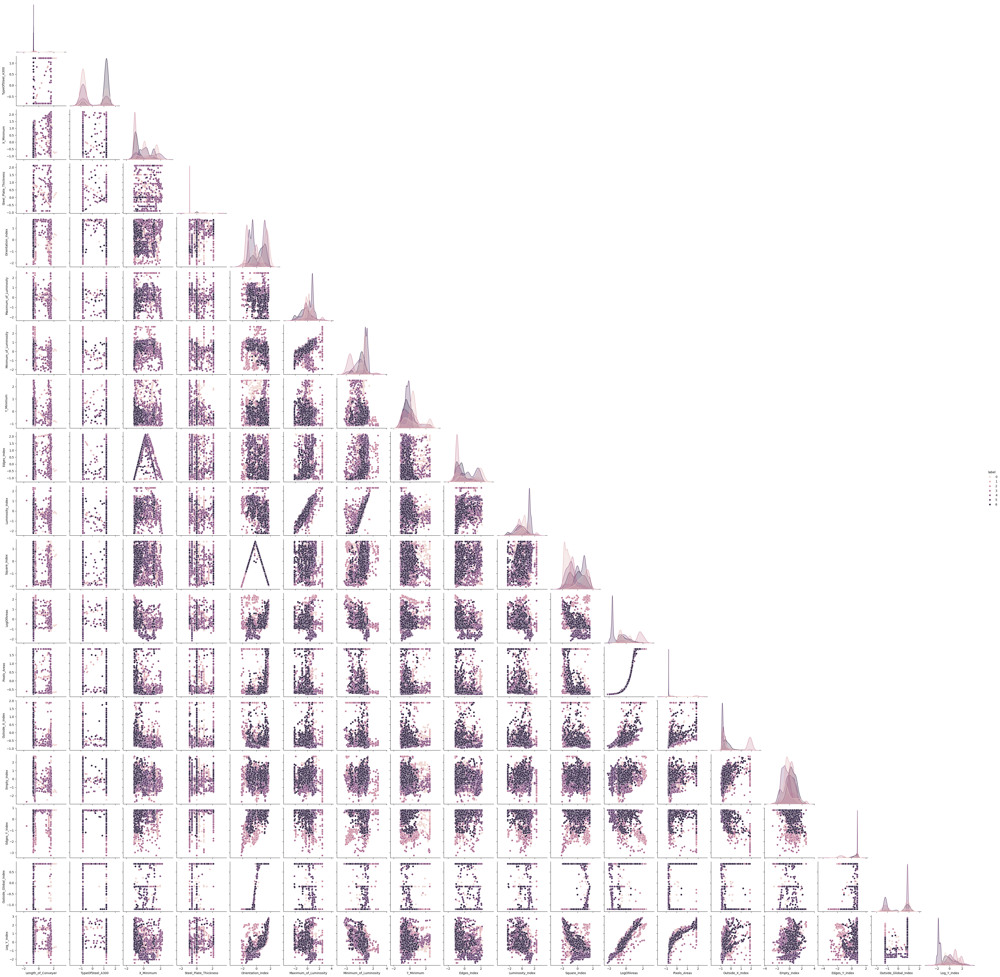

In [130]:
import pandas as pd
df_pair = pd.DataFrame(X_train_sel, columns=X_train_sel.columns)
df_pair["label"] = y_resampled
sns.pairplot(df_pair, hue="label", corner=True)


## 建立與訓練多模型

In [131]:
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from flaml import AutoML

models = {}

# LightGBM baseline (原始 class_weight)
lgb_baseline = LGBMClassifier(class_weight='balanced', random_state=42)
lgb_baseline.fit(X_train_sel, y_resampled)
models["LGBM_baseline"] = lgb_baseline

## 使用 Optuna 對 LightGBM 調參
import optuna
from sklearn.model_selection import cross_val_score
import lightgbm as lgb

def objective(trial):
    params = {
        'objective': 'multiclass',
        'num_class': len(np.unique(y_resampled)),
        'metric': 'multi_logloss',
        'boosting_type': 'gbdt',
        'learning_rate': trial.suggest_float("learning_rate", 0.01, 0.2, log=True),
        'num_leaves': trial.suggest_int("num_leaves", 20, 150),
        'max_depth': trial.suggest_int("max_depth", 3, 10),
        'min_child_samples': trial.suggest_int("min_child_samples", 5, 50),
        'subsample': trial.suggest_float("subsample", 0.6, 1.0),
        'colsample_bytree': trial.suggest_float("colsample_bytree", 0.6, 1.0),
        'random_state': 42
    }

    model = lgb.LGBMClassifier(**params)
    score = cross_val_score(model, X_train_sel, y_resampled, cv=3, scoring='f1_weighted').mean()
    return score

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=30)

best_params = study.best_params


lgb_optuna = lgb.LGBMClassifier(**best_params)
lgb_optuna.fit(X_train_sel, y_resampled)
models["LGBM_Optuna"] = lgb_optuna


# CatBoost
from sklearn.utils.class_weight import compute_class_weight
# 計算每個類別的 class_weight
class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_resampled), y=y_resampled)
class_weights_dict = dict(zip(np.unique(y_resampled), class_weights))
# 傳入 CatBoost
cat = CatBoostClassifier(verbose=0, class_weights=class_weights_dict, random_state=42)
cat.fit(X_train_sel, y_resampled)
models["CatBoost"] = cat

# FLAML AutoML
automl = AutoML()
automl.fit(X_train_sel, y_resampled, task="classification", time_budget=60, verbose=0)
models["FLAML"] = automl.model


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4139
[LightGBM] [Info] Number of data points in the train set: 3113, number of used features: 18
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[I 2025-05-15 16:36:20,123] A new study created in memory with name: no-name-aac21df0-838c-438a-8fda-e5f7846976ce


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3987
[LightGBM] [Info] Number of data points in the train set: 2075, number of used features: 18
[LightGBM] [Info] Start training from score -2.244089
[LightGBM] [Info] Start training from score -1.759981
[LightGBM] [Info] Start training from score -1.817634
[LightGBM] [Info] Start training from score -2.817435
[LightGBM] [Info] Start training from score -1.826575
[LightGBM] [Info] Start training from score -1.757183
[LightGBM] [Info] Start training from score -1.794172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[I 2025-05-15 16:36:28,304] Trial 0 finished with value: 0.987075470343584 and parameters: {'learning_rate': 0.10259649003503706, 'num_leaves': 123, 'max_depth': 7, 'min_child_samples': 29, 'subsample': 0.8215839864728907, 'colsample_bytree': 0.7712132190120862}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3987
[LightGBM] [Info] Number of data points in the train set: 2075, number of used features: 18
[LightGBM] [Info] Start training from score -2.244089
[LightGBM] [Info] Start training from score -1.759981
[LightGBM] [Info] Start training from score -1.817634
[LightGBM] [Info] Start training from score -2.817435
[LightGBM] [Info] Start training from score -1.826575
[LightGBM] [Info] Start training from score -1.757183
[LightGBM] [Info] Start training from score -1.794172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[I 2025-05-15 16:36:39,443] Trial 1 finished with value: 0.9864273583035525 and parameters: {'learning_rate': 0.10528858951835486, 'num_leaves': 148, 'max_depth': 9, 'min_child_samples': 25, 'subsample': 0.8497747164681305, 'colsample_bytree': 0.6479719550185822}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:36:47,764] Trial 2 finished with value: 0.9750400283340923 and parameters: {'learning_rate': 0.01772990862788645, 'num_leaves': 26, 'max_depth': 8, 'min_child_samples': 9, 'subsample': 0.9768006175826675, 'colsample_bytree': 0.7883734859218198}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3987
[LightGBM] [Info] Number of data points in the train set: 2075, number of used features: 18
[LightGBM] [Info] Start training from score -2.244089
[LightGBM] [Info] Start training from score -1.759981
[LightGBM] [Info] Start training from score -1.817634
[LightGBM] [Info] Start training from score -2.817435
[LightGBM] [Info] Start training from score -1.826575
[LightGBM] [Info] Start training from score -1.757183
[LightGBM] [Info] Start training from score -1.794172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[I 2025-05-15 16:36:58,880] Trial 3 finished with value: 0.9625946069717606 and parameters: {'learning_rate': 0.013703386954269004, 'num_leaves': 116, 'max_depth': 10, 'min_child_samples': 40, 'subsample': 0.8143284073734401, 'colsample_bytree': 0.6851922553096768}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

[I 2025-05-15 16:37:01,026] Trial 4 finished with value: 0.9407177883732745 and parameters: {'learning_rate': 0.021112321170682347, 'num_leaves': 28, 'max_depth': 3, 'min_child_samples': 48, 'subsample': 0.7559875828277233, 'colsample_bytree': 0.7628333447306331}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000293 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3987
[LightGBM] [Info] Number of data points in the train s

[I 2025-05-15 16:37:09,099] Trial 5 finished with value: 0.9713052293293712 and parameters: {'learning_rate': 0.021097248664340373, 'num_leaves': 38, 'max_depth': 6, 'min_child_samples': 16, 'subsample': 0.9178203163700188, 'colsample_bytree': 0.9715043370608394}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:37:13,893] Trial 6 finished with value: 0.9695808078662299 and parameters: {'learning_rate': 0.028554972148933162, 'num_leaves': 61, 'max_depth': 5, 'min_child_samples': 45, 'subsample': 0.8465461610934346, 'colsample_bytree': 0.9127351316879841}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:37:21,165] Trial 7 finished with value: 0.9712436901855273 and parameters: {'learning_rate': 0.01372461618172915, 'num_leaves': 22, 'max_depth': 7, 'min_child_samples': 9, 'subsample': 0.6944514879446012, 'colsample_bytree': 0.8816701645729546}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3987
[LightGBM] [Info] Number of data points in the train set: 2075, number of used features: 18
[LightGBM] [Info] Start training from score -2.244089
[LightGBM] [Info] Start training from score -1.759981
[LightGBM] [Info] Start training from score -1.817634
[LightGBM] [Info] Start training from score -2.817435
[LightGBM] [Info] Start training from score -1.826575
[LightGBM] [Info] Start training from score -1.757183
[LightGBM] [Info] Start training from score -1.794172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[I 2025-05-15 16:37:33,321] Trial 8 finished with value: 0.9841691946862511 and parameters: {'learning_rate': 0.08090116397835599, 'num_leaves': 54, 'max_depth': 7, 'min_child_samples': 10, 'subsample': 0.7600159640874499, 'colsample_bytree': 0.6531808086357347}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3987
[LightGBM] [Info] Number of data points in the train set: 2075, number of used features: 18
[LightGBM] [Info] Start training from score -2.244089
[LightGBM] [Info] Start training from score -1.759981
[LightGBM] [Info] Start training from score -1.817634
[LightGBM] [Info] Start training from score -2.817435
[LightGBM] [Info] Start training from score -1.826575
[LightGBM] [Info] Start training from score -1.757183
[LightGBM] [Info] Start training from score -1.794172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

[I 2025-05-15 16:37:39,286] Trial 9 finished with value: 0.9864446204179108 and parameters: {'learning_rate': 0.18990247233863564, 'num_leaves': 108, 'max_depth': 9, 'min_child_samples': 47, 'subsample': 0.9220579574763749, 'colsample_bytree': 0.7686263485347197}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:37:42,961] Trial 10 finished with value: 0.9785555897701927 and parameters: {'learning_rate': 0.05214992010150691, 'num_leaves': 150, 'max_depth': 4, 'min_child_samples': 32, 'subsample': 0.610571817386442, 'colsample_bytree': 0.8402810366460345}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:37:50,289] Trial 11 finished with value: 0.9863686866178386 and parameters: {'learning_rate': 0.16490019587249874, 'num_leaves': 106, 'max_depth': 9, 'min_child_samples': 33, 'subsample': 0.9170093114980299, 'colsample_bytree': 0.7205044802519631}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:37:58,054] Trial 12 finished with value: 0.9858173730987838 and parameters: {'learning_rate': 0.1882332061464686, 'num_leaves': 112, 'max_depth': 10, 'min_child_samples': 24, 'subsample': 0.9137280874890468, 'colsample_bytree': 0.7463477635124875}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:38:06,140] Trial 13 finished with value: 0.985089515653908 and parameters: {'learning_rate': 0.12003090923593633, 'num_leaves': 89, 'max_depth': 8, 'min_child_samples': 40, 'subsample': 0.9976064663583384, 'colsample_bytree': 0.8274809986604597}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:38:14,562] Trial 14 finished with value: 0.9828518258867311 and parameters: {'learning_rate': 0.06325000651448005, 'num_leaves': 129, 'max_depth': 6, 'min_child_samples': 19, 'subsample': 0.8716364490653523, 'colsample_bytree': 0.6119186877001453}. Best is trial 0 with value: 0.987075470343584.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3987
[LightGBM] [Info] Number of data points in the train s

[I 2025-05-15 16:38:22,827] Trial 15 finished with value: 0.9880688460493171 and parameters: {'learning_rate': 0.12802745590440168, 'num_leaves': 88, 'max_depth': 8, 'min_child_samples': 34, 'subsample': 0.7692534626768727, 'colsample_bytree': 0.7157259861931617}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:38:31,570] Trial 16 finished with value: 0.9864506647318748 and parameters: {'learning_rate': 0.11271842643269421, 'num_leaves': 81, 'max_depth': 8, 'min_child_samples': 33, 'subsample': 0.7132306010260041, 'colsample_bytree': 0.6977558701295036}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:38:36,421] Trial 17 finished with value: 0.9791882757687422 and parameters: {'learning_rate': 0.036850004194436445, 'num_leaves': 76, 'max_depth': 5, 'min_child_samples': 38, 'subsample': 0.6565284694202003, 'colsample_bytree': 0.8219649351593703}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:38:45,362] Trial 18 finished with value: 0.984481824147255 and parameters: {'learning_rate': 0.07664415261459745, 'num_leaves': 133, 'max_depth': 7, 'min_child_samples': 30, 'subsample': 0.7890387176715533, 'colsample_bytree': 0.8809818495279775}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:38:50,264] Trial 19 finished with value: 0.9844770026431306 and parameters: {'learning_rate': 0.1323987497200277, 'num_leaves': 93, 'max_depth': 5, 'min_child_samples': 21, 'subsample': 0.733528739380337, 'colsample_bytree': 0.725794557496262}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:38:56,922] Trial 20 finished with value: 0.9848185769936303 and parameters: {'learning_rate': 0.08520434328991949, 'num_leaves': 66, 'max_depth': 6, 'min_child_samples': 37, 'subsample': 0.8024687040732777, 'colsample_bytree': 0.6032640928961608}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:39:04,992] Trial 21 finished with value: 0.9864572682739855 and parameters: {'learning_rate': 0.13265995660892513, 'num_leaves': 74, 'max_depth': 8, 'min_child_samples': 27, 'subsample': 0.7124953792930728, 'colsample_bytree': 0.6895044319700313}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:39:12,430] Trial 22 finished with value: 0.9867508733420931 and parameters: {'learning_rate': 0.1442852066215595, 'num_leaves': 98, 'max_depth': 8, 'min_child_samples': 28, 'subsample': 0.6811015538130412, 'colsample_bytree': 0.6731217799436876}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:39:18,887] Trial 23 finished with value: 0.9851063730755315 and parameters: {'learning_rate': 0.15631587081168194, 'num_leaves': 96, 'max_depth': 7, 'min_child_samples': 28, 'subsample': 0.6604398938017745, 'colsample_bytree': 0.6729879509776396}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:39:32,386] Trial 24 finished with value: 0.9847747234590841 and parameters: {'learning_rate': 0.09457935127245522, 'num_leaves': 124, 'max_depth': 9, 'min_child_samples': 15, 'subsample': 0.6060957941005238, 'colsample_bytree': 0.7297054577969796}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:39:42,696] Trial 25 finished with value: 0.9860545873770614 and parameters: {'learning_rate': 0.06001049009681844, 'num_leaves': 103, 'max_depth': 8, 'min_child_samples': 35, 'subsample': 0.6700037008071129, 'colsample_bytree': 0.6367032631490299}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:39:52,471] Trial 26 finished with value: 0.982682268872778 and parameters: {'learning_rate': 0.04194879323919875, 'num_leaves': 139, 'max_depth': 7, 'min_child_samples': 22, 'subsample': 0.7680958225405458, 'colsample_bytree': 0.7771800266773625}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:40:03,175] Trial 27 finished with value: 0.985122314887998 and parameters: {'learning_rate': 0.06908451569173911, 'num_leaves': 120, 'max_depth': 9, 'min_child_samples': 43, 'subsample': 0.823897185634093, 'colsample_bytree': 0.7219789629614823}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3987
[LightGBM] [Info] Number of data points in the train set: 2075, number of used features: 18
[LightGBM] [Info] Start training from score -2.244089
[LightGBM] [Info] Start training from score -1.759981
[Lig

[I 2025-05-15 16:40:10,562] Trial 28 finished with value: 0.9874263847035358 and parameters: {'learning_rate': 0.1437624990242441, 'num_leaves': 99, 'max_depth': 8, 'min_child_samples': 29, 'subsample': 0.7355821588595791, 'colsample_bytree': 0.803850488877906}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-15 16:40:17,512] Trial 29 finished with value: 0.9844788207328955 and parameters: {'learning_rate': 0.10252522303501768, 'num_leaves': 139, 'max_depth': 6, 'min_child_samples': 25, 'subsample': 0.8691817310590134, 'colsample_bytree': 0.8473767481113975}. Best is trial 15 with value: 0.9880688460493171.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

## 模型效能評估（macro F1、ROC AUC、PR AUC）


📌 LGBM_baseline 分類報告：
              precision    recall  f1-score   support

       Bumps       0.62      0.75      0.68        81
   Dirtiness       0.69      1.00      0.81        11
    K_Scatch       0.99      0.96      0.97        78
Other_Faults       0.87      0.50      0.64       135
      Pastry       0.46      0.88      0.60        32
      Stains       0.75      0.86      0.80        14
   Z_Scratch       0.86      0.97      0.91        38

    accuracy                           0.75       389
   macro avg       0.75      0.85      0.77       389
weighted avg       0.80      0.75      0.75       389



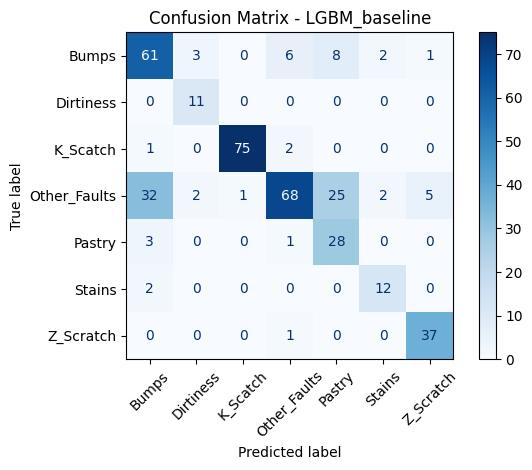


📌 LGBM_Optuna 分類報告：
              precision    recall  f1-score   support

       Bumps       0.62      0.75      0.68        81
   Dirtiness       0.59      0.91      0.71        11
    K_Scatch       0.99      0.95      0.97        78
Other_Faults       0.82      0.47      0.60       135
      Pastry       0.42      0.81      0.55        32
      Stains       0.86      0.86      0.86        14
   Z_Scratch       0.82      0.97      0.89        38

    accuracy                           0.73       389
   macro avg       0.73      0.82      0.75       389
weighted avg       0.77      0.73      0.73       389



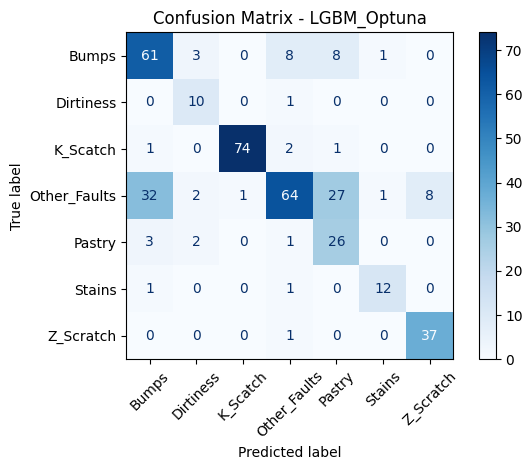


📌 CatBoost 分類報告：
              precision    recall  f1-score   support

       Bumps       0.64      0.75      0.69        81
   Dirtiness       0.67      0.91      0.77        11
    K_Scatch       0.99      0.95      0.97        78
Other_Faults       0.88      0.52      0.65       135
      Pastry       0.41      0.81      0.54        32
      Stains       0.86      0.86      0.86        14
   Z_Scratch       0.80      0.97      0.88        38

    accuracy                           0.75       389
   macro avg       0.75      0.82      0.77       389
weighted avg       0.80      0.75      0.75       389



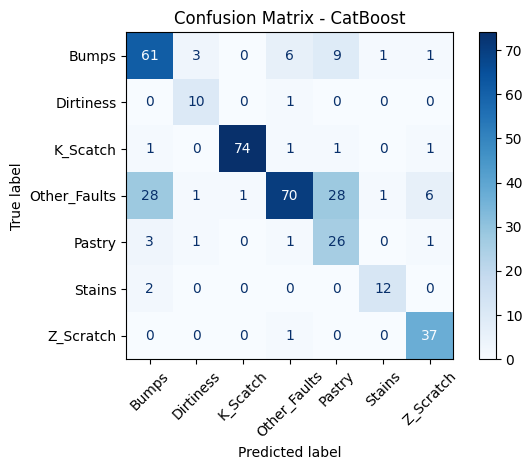


📌 FLAML 分類報告：
              precision    recall  f1-score   support

       Bumps       0.64      0.75      0.69        81
   Dirtiness       0.71      0.91      0.80        11
    K_Scatch       0.99      0.95      0.97        78
Other_Faults       0.88      0.47      0.62       135
      Pastry       0.39      0.84      0.53        32
      Stains       0.80      0.86      0.83        14
   Z_Scratch       0.79      0.97      0.87        38

    accuracy                           0.73       389
   macro avg       0.74      0.82      0.76       389
weighted avg       0.79      0.73      0.73       389



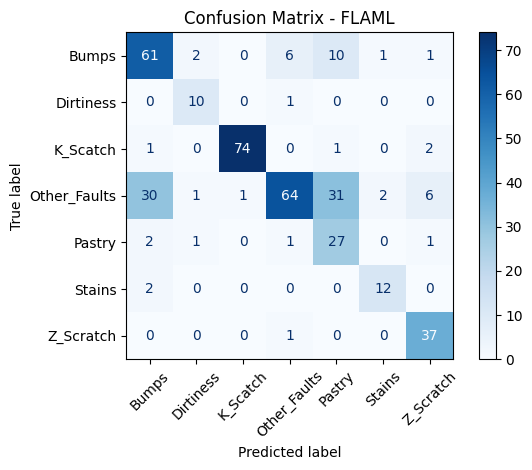

,model,macro_f1,roc_auc,pr_auc
0,LGBM_baseline,0.774407,0.949474,0.843397
2,CatBoost,0.765808,0.956962,0.853431
3,FLAML,0.757828,0.955269,0.849789
1,LGBM_Optuna,0.752287,0.952845,0.853464


In [132]:
from sklearn.metrics import f1_score, classification_report, roc_auc_score, average_precision_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

results = []
y_true_bin = label_binarize(y_test_enc, classes=np.unique(y_resampled))

for name, model in models.items():
    y_pred = model.predict(X_test_sel)
    y_proba = model.predict_proba(X_test_sel)
    macro_f1 = f1_score(y_test_enc, y_pred, average='macro')
    macro_roc = roc_auc_score(y_test_enc, y_proba, multi_class='ovr')
    macro_pr = average_precision_score(y_true_bin, y_proba)

    print(f"\n📌 {name} 分類報告：")
    print(classification_report(y_test_enc, y_pred, target_names=le.classes_))

    cm = confusion_matrix(y_test_enc, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
    disp.plot(cmap="Blues", xticks_rotation=45)
    plt.title(f"Confusion Matrix - {name}")
    plt.tight_layout()
    plt.show()

    results.append({
        "model": name,
        "macro_f1": macro_f1,
        "roc_auc": macro_roc,
        "pr_auc": macro_pr
    })

df_results = pd.DataFrame(results).sort_values(by="macro_f1", ascending=False)
df_results


## 4. Macro-average ROC 與 PR 曲線

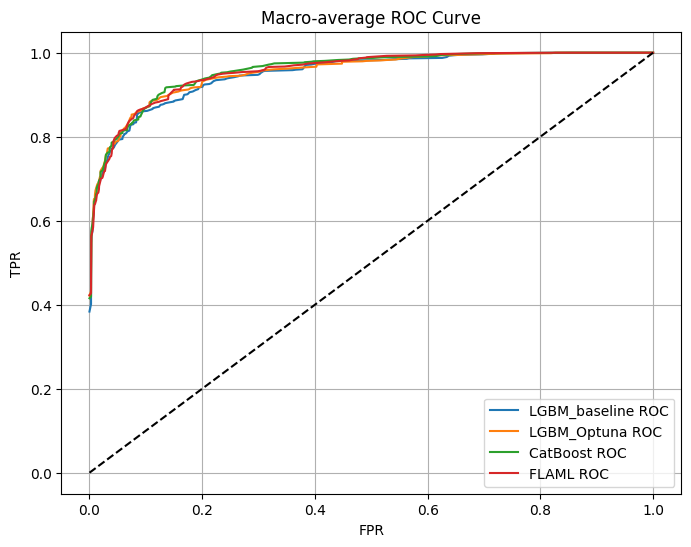

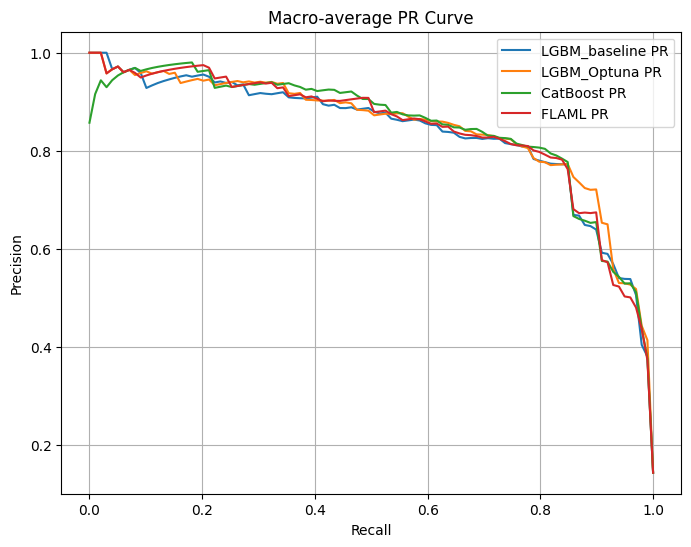

In [133]:
from sklearn.metrics import precision_recall_curve, roc_curve

def plot_macro_roc_pr(models, X_test, y_test_enc):
    y_bin = label_binarize(y_test_enc, classes=np.unique(y_test_enc))
    n_classes = y_bin.shape[1]

    plt.figure(figsize=(8, 6))
    for name, model in models.items():
        y_score = model.predict_proba(X_test)
        # ROC
        fpr, tpr = {}, {}
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_score[:, i])
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
        mean_tpr /= n_classes
        plt.plot(all_fpr, mean_tpr, label=f"{name} ROC")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title("Macro-average ROC Curve")
    plt.xlabel("FPR"); plt.ylabel("TPR"); plt.legend(); plt.grid(); plt.show()

    # PR
    plt.figure(figsize=(8, 6))
    for name, model in models.items():
        y_score = model.predict_proba(X_test)
        precision, recall = [], []
        for i in range(n_classes):
            p, r, _ = precision_recall_curve(y_bin[:, i], y_score[:, i])
            recall_interp = np.linspace(0, 1, 100)
            p_interp = np.interp(recall_interp, r[::-1], p[::-1])
            precision.append(p_interp)
        mean_p = np.mean(precision, axis=0)
        plt.plot(recall_interp, mean_p, label=f"{name} PR")
    plt.title("Macro-average PR Curve")
    plt.xlabel("Recall"); plt.ylabel("Precision"); plt.legend(); plt.grid(); plt.show()

plot_macro_roc_pr(models, X_test_sel, y_test_enc)


## SHAP 解釋最佳模型（用 top-1 模型）

best model: LGBM_baseline


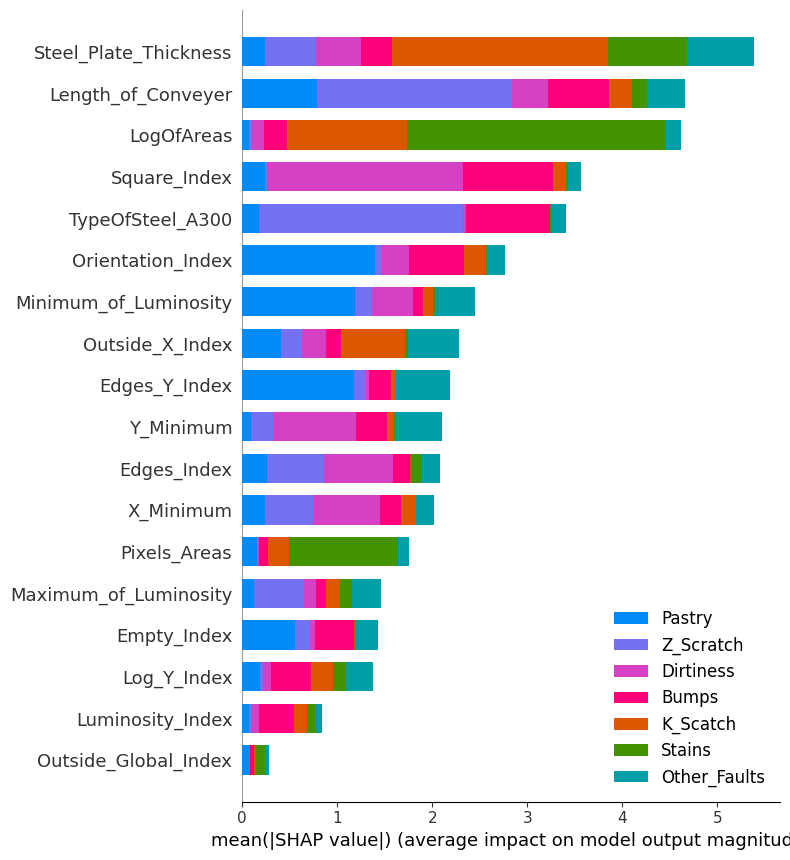

<Figure size 640x480 with 0 Axes>

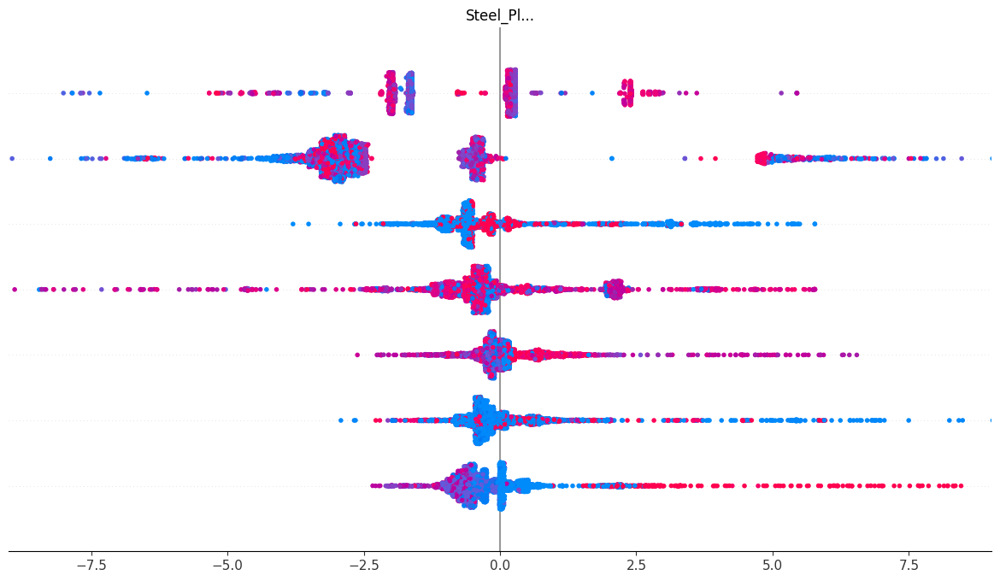

In [134]:
import shap
best_model_name = df_results.iloc[0]['model']
best_model = models[best_model_name]
print('best model:',best_model_name)
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_train_sel)

shap.summary_plot(shap_values, X_train_sel, plot_type="bar", class_names=le.classes_)
shap.summary_plot(shap_values, X_train_sel, class_names=le.classes_)


# 5. 困難類別處理策略

## 去除 "Bumps", "Other_Faults", "Pastry" 三個類別進行訓練，看其他類別預測狀況

📊 分類報告（不含 Bumps / Other_Faults / Pastry）：
              precision    recall  f1-score   support

   Dirtiness       0.85      1.00      0.92        11
    K_Scatch       1.00      0.97      0.99        78
      Stains       1.00      0.86      0.92        14
   Z_Scratch       0.95      1.00      0.97        38

    accuracy                           0.97       141
   macro avg       0.95      0.96      0.95       141
weighted avg       0.97      0.97      0.97       141



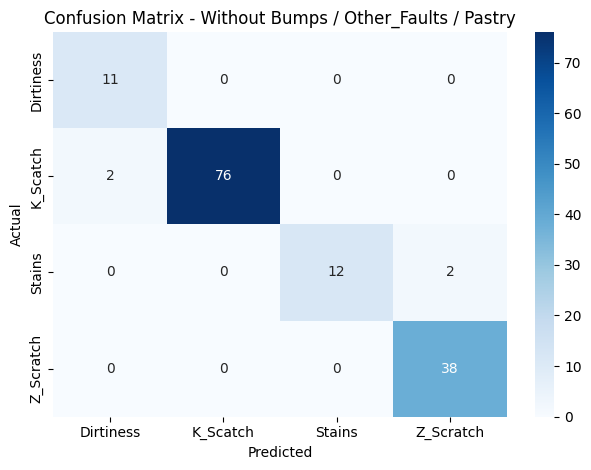

In [135]:
from lightgbm import LGBMClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# === Step 1: 去除 "Bumps", "Other_Faults", "Pastry"
exclude_classes = ["Bumps", "Other_Faults", "Pastry"]
y_label_resampled = le.inverse_transform(y_resampled)
mask_keep = ~pd.Series(y_label_resampled).isin(exclude_classes)

X_filtered = X_train_sel[mask_keep]
y_filtered = y_label_resampled[mask_keep]

# === Step 2: Label encode 保留的類別
le_filtered = LabelEncoder()
y_filtered_enc = le_filtered.fit_transform(y_filtered)

# === Step 3: 訓練模型
filtered_model = LGBMClassifier(random_state=42)
filtered_model.fit(X_filtered, y_filtered_enc)

# === Step 4: 測試資料中也去除這三類
y_test_text = le.inverse_transform(y_test_enc)
mask_test_keep = ~pd.Series(y_test_text).isin(exclude_classes)
X_test_filtered = X_test_sel[mask_test_keep]
y_test_filtered_text = pd.Series(y_test_text)[mask_test_keep].values
y_test_filtered_enc = le_filtered.transform(y_test_filtered_text)

# === Step 5: 預測與評估
y_pred = filtered_model.predict(X_test_filtered)

print("📊 分類報告（不含 Bumps / Other_Faults / Pastry）：")
print(classification_report(y_test_filtered_enc, y_pred, target_names=le_filtered.classes_))

cm = confusion_matrix(y_test_filtered_enc, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues",
            xticklabels=le_filtered.classes_, yticklabels=le_filtered.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Without Bumps / Other_Faults / Pastry")
plt.tight_layout()
plt.show()

## 將 "Bumps", "Other_Faults", "Pastry" 歸成一類進行訓練，看預測狀況
由於去除"Bumps", "Other_Faults", "Pastry"後，其他類別預測表現很好

📊 分類報告（合併 Bumps / Other_Faults / Pastry → other）：
              precision    recall  f1-score   support

   Dirtiness       0.83      0.91      0.87        11
    K_Scatch       0.99      0.95      0.97        78
      Stains       0.80      0.86      0.83        14
   Z_Scratch       0.85      0.92      0.89        38
       other       0.96      0.95      0.96       248

    accuracy                           0.94       389
   macro avg       0.89      0.92      0.90       389
weighted avg       0.95      0.94      0.94       389



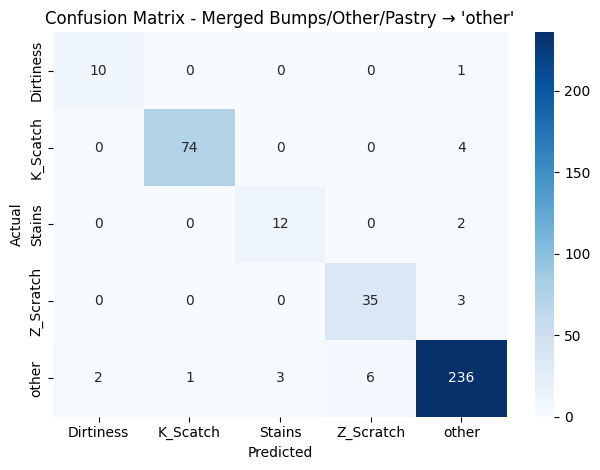

In [136]:
from lightgbm import LGBMClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# === Step 1: 將三個類別合併成一類叫做 "other"
merge_classes = ["Bumps", "Other_Faults", "Pastry"]
y_label_resampled = le.inverse_transform(y_resampled)
y_label_merged = ["other" if y in merge_classes else y for y in y_label_resampled]

# === Step 2: 重新編碼 + 訓練模型
le_merged = LabelEncoder()
y_merged_enc = le_merged.fit_transform(y_label_merged)
merged_model = LGBMClassifier(random_state=42)
merged_model.fit(X_train_sel, y_merged_enc)

# === Step 3: 測試資料也合併這三類成 "other"
y_test_text = le.inverse_transform(y_test_enc)
y_test_merged = ["other" if y in merge_classes else y for y in y_test_text]
y_test_merged_enc = le_merged.transform(y_test_merged)

# === Step 4: 預測與評估
y_pred = merged_model.predict(X_test_sel)

print("📊 分類報告（合併 Bumps / Other_Faults / Pastry → other）：")
print(classification_report(y_test_merged_enc, y_pred, target_names=le_merged.classes_))

cm = confusion_matrix(y_test_merged_enc, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap="Blues",
            xticklabels=le_merged.classes_, yticklabels=le_merged.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Merged Bumps/Other/Pastry → 'other'")
plt.tight_layout()
plt.show()

在本任務中，`Bumps`、`Other_Faults`、`Pastry` 這三個類別在所有模型下的分類效果皆偏差，無論透過：
- 類別重抽樣（如 SMOTEENN）
- 分階段建模（two-stage classification）
- 調整 threshold 或 class_weight

皆難以穩定提升其 precision 或 recall。

因此，最終策略為：
👉 將這三個困難類別合併為單一類別 `"other"`  
這樣可以同時達到：
- **簡化模型任務**（由 7 類簡化為 5 類）
- **強化其餘類別的預測效能**
- 保留瑕疵資訊，又避免模型混淆

結果顯示此策略能顯著提升整體模型的 `macro F1` 與 `accuracy`，也讓模型更穩定。